# Tutorial: Distributed Acoustic Sensing (DAS) data analysis

Distributed Acoustic Sensing (DAS) turns fibre-optic cables into seismological antennas of up to thousands of equally-spaced sensors. This extra dimension allows us to analyse the data in different ways than we usually do for single-station recordings. In this tutorial, we will see how to:

1. Plot DAS data in _waterfall_ plots
2. Create and interpret an $fk$-diagram
3. Extract signals with a specific velocity using $fk$-analysis
4. Use a Deep Learning model to filter DAS data

In [1]:
%matplotlib notebook

In [2]:
import os
import sys
import matplotlib.pyplot as plt
import h5py
import scipy.fft
import numpy as np

# Import various routines from `filters.py`
# All these functions have documentation built-in, which you
# can access with e.g. print(filter_fk.__doc__)
from filters import taper_filter, make_fk, cut_fk, filter_fk

In [3]:
""" 
The following lines will expand the viewport of your Jupyter notebook,
which is useful for plotting large figures.
"""

# Page width in % of the total screen width
page_width = 90

from IPython.core.display import display, HTML
# display(HTML("<style>.container { width:%i%% !important; }</style>" % page_width))

# 0. Load data

The DAS data were acquired from a cable deployed offshore Toulon, in the South of France. This cable was sensed up to a distance of 45km with a gauge length of 10m. During the measurement campaign, several T-waves were recorded, likely originating near the Algerian coast.

> _T-waves are acoustic waves generated by submarine earthquakes that travel through the water column. When they approach a coastline, the acoustic wave interacts with the bathymetry to generate seismic waves. These seismic waves can be recorded by on-land seismic stations._

To exemplify the $fk$-analysis, we will look into the recordings of one such T-wave, made at a straight segment of the cable (indicated in red in the figure below). The data are pre-processed with a low-pass filter ($< 50$ Hz).

![](cable_loc.png)

In [4]:
# Load the pre-processed DAS data (low-pass filtered < 50 Hz)

with h5py.File("tutorial_T-wave.h5", "r") as f:
    samp = f["strain"].attrs["samp"]
    gauge = f["strain"].attrs["gauge"]
    data = f["strain"][:600]
    
# The low-frequency signals in the DAS data are very strong, and so depending on the
# frequency band, we will see different features.

# Use print(taper_filter.__doc__) to see the documentation for this function
data_filt = taper_filter(data, fmin=2, fmax=-1, samp_DAS=samp, order=4, mode="sos")

# Define a data scale for plotting
scale = data_filt.std()

## 0.1 Visualisation

<IPython.core.display.Javascript object>


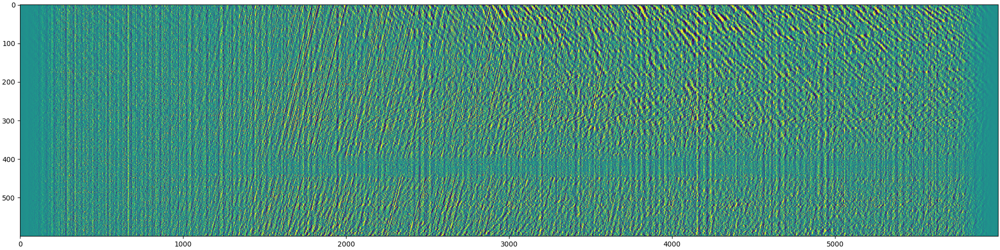

In [5]:
# It's best to close your notebook figures to save memory
plt.close("all")

# Draw the canvas
plt.figure(figsize=(20, 5), constrained_layout=True)

# plt.imshow is a very efficient routine for plotting two-dimensional data
# It is much faster than plt.pcolormesh or plt.contourf
plt.imshow(data_filt / scale, vmin=-2, vmax=2, aspect="auto", interpolation="none")

plt.show()

# 1. Create an $fk$-diagram

A frequency-wavenumber diagram is essentially a 2D Fourier transform of your data. In such a representation, signals that propagate with a phase speed $v$ will plot on a line with slope $f \; / \; k$ ($k$: wavenumber; $f$: temporal frequency). Dispersive surface waves will show up as curved lines, with the local tangent equal to their group velocity ($g = \partial f \; / \; \partial k$). Note that all the quantities ($v$, $f$, $k$) are signed, meaning that they can be positive and negative. Because our signals are real (and consequently the Fourier transform radially symmetric), we will get 4 quadrants with 2-fold radial symmetry. Since two of the four quadrants are redundant, we typically only show two quadrants: one with positive velocity ($f, k > 0$), and one with negative velocity ($f > 0$, $k < 0$).

## 1.1 Complete $fk$-spectrum

<IPython.core.display.Javascript object>


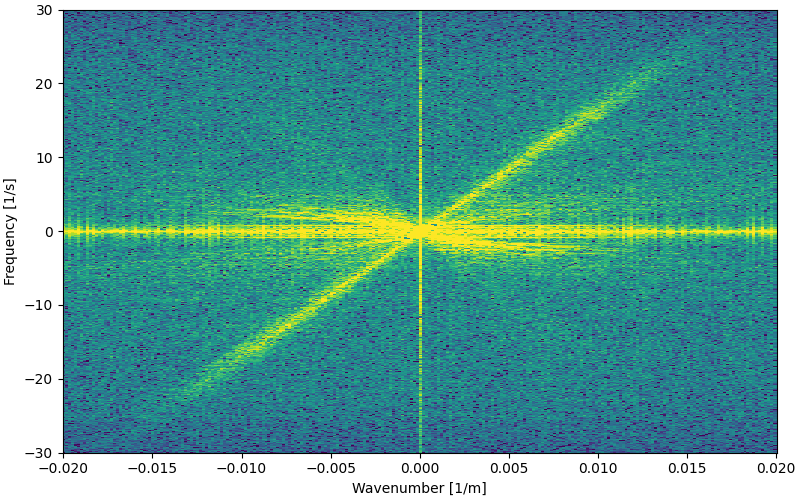

In [6]:
# Compute an fk-diagram of the DAS data
f, k, PSD = make_fk(data, gauge, samp, merge=False)

# Cut the fk-diagram between 0 and 30 Hz, and clip the wavenumbers between -0.02 and 0.02
f_cut, k_cut, PSD_cut = cut_fk(PSD, f=f, f_range=(-30, 30), k=k, k_range=(-0.02, 0.02))

# Scale the fk-diagram for plotting purposes
PSD_cut = PSD_cut - PSD_cut.min()
PSD_cut = PSD_cut / PSD_cut.max()

# Show cut fk-diagram and velocity bounds
plt.close("all")
plt.figure(figsize=(8, 5), constrained_layout=True)
plt.pcolormesh(k_cut, f_cut, PSD_cut, cmap="viridis", vmin=0.3, vmax=0.55, shading="nearest")
plt.xlabel("Wavenumber [1/m]")
plt.ylabel("Frequency [1/s]")
plt.show()

## 1.2 Half $fk$-spectrum

<IPython.core.display.Javascript object>


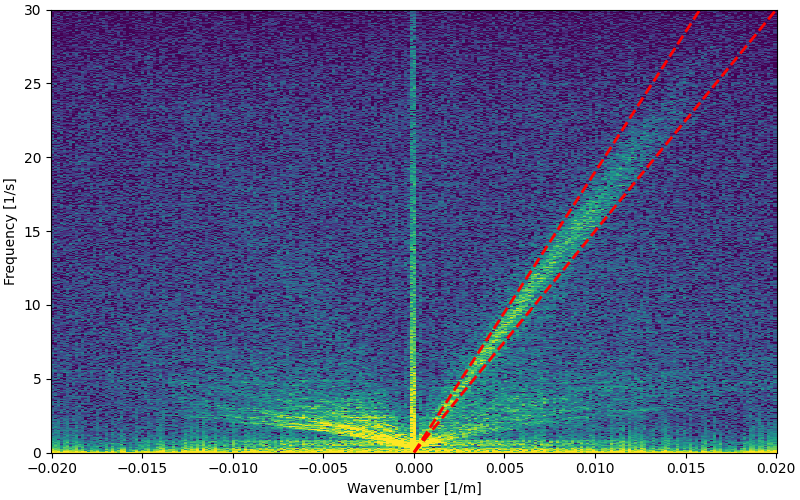

In [7]:
# Compute an fk-diagram of the DAS data
f, k, PSD = make_fk(data, gauge, samp, merge=True)

# Cut the fk-diagram between 0 and 30 Hz, and clip the wavenumbers between -0.02 and 0.02
f_cut, k_cut, PSD_cut = cut_fk(PSD, f=f, f_range=(0, 30), k=k, k_range=(-0.02, 0.02))

# Scale the fk-diagram for plotting purposes
PSD_cut = PSD_cut - PSD_cut.min()
PSD_cut = PSD_cut / PSD_cut.max()

# The velocity range (in m/s) which we want to filter (between 1500 and 1900 m/s)
v_min = 1500
v_max = 1900

# Upper and lower filter bounds
f_range = np.linspace(f_cut.min(), f_cut.max(), 10)
k_range_min = f_range / v_min
k_range_max = f_range / v_max

# Show cut fk-diagram and velocity bounds
plt.close("all")
plt.figure(figsize=(8, 5), constrained_layout=True)
plt.pcolormesh(k_cut, f_cut, PSD_cut, cmap="viridis", vmin=0.3, vmax=0.55, shading="nearest")
plt.plot(k_range_min, f_range, "r--", lw=2)
plt.plot(k_range_max, f_range, "r--", lw=2)
plt.xlabel("Wavenumber [1/m]")
plt.ylabel("Frequency [1/s]")
plt.show()

# 2. Extract specific velocities ($fk$-filtering)

In a similar way that bandpass filters work, we can extract signals that travel with a specific velocity by damping all Fourier coefficients outside of the desired range of velocities. The inverse Fourier transform then gives the filtered data in the time-domain.

<IPython.core.display.Javascript object>


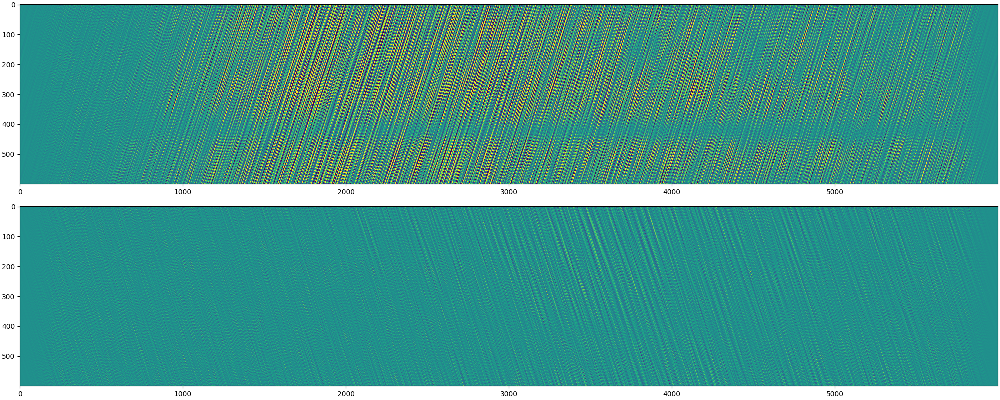

In [8]:
# fk-filter data between positive v_min and v_max
data_fk, _ = filter_fk(data_filt, gauge, samp, v_min, v_max)

# fk-filter data between negative v_min and v_max
data_fk2, _ = filter_fk(data_filt, gauge, samp, -v_max, -v_min)

# Show filtered data (on same scale)
plt.close("all")
fig, axes = plt.subplots(nrows=2, figsize=(20, 8), constrained_layout=True)
axes[0].imshow(data_fk / data_fk.std(), vmin=-2, vmax=2, aspect="auto", interpolation="none")
axes[1].imshow(data_fk2 / data_fk.std(), vmin=-2, vmax=2, aspect="auto", interpolation="none")
plt.show()

## 2.1 $fk$-filtering of random noise

Even if no spatial correlations exist (like in Gaussian random noise), $fk$-filtering of such data will still "reveal" spatial patterns. Be careful when interpreting $fk$-filtered data, as it could create signals that are not really there!

<IPython.core.display.Javascript object>


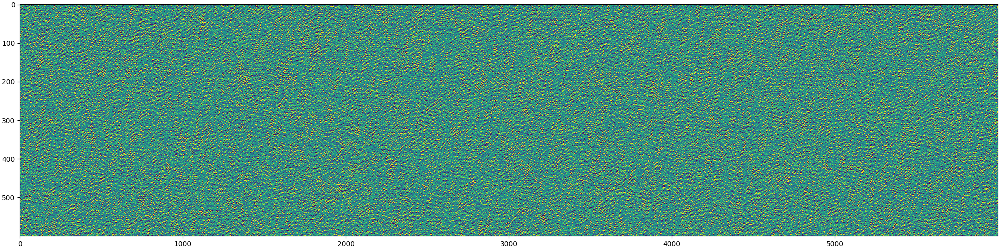

In [9]:
random_data = np.random.randn(*data_filt.shape)

# fk-filter strain data between v_min and v_max
random_fk, _ = filter_fk(random_data, gauge, samp, v_min, v_max)

# Show filtered data
plt.close("all")
plt.figure(figsize=(20, 5), constrained_layout=True)
plt.imshow(random_fk / random_fk.std(), vmin=-2, vmax=2, aspect="auto", interpolation="none")
plt.show()

# 3. Deep Learning filtering

In [10]:
cwd = os.getcwd()
jdasdir = os.path.abspath(os.path.join(cwd, "..", "..", "jDAS"))
modeldir = os.path.abspath(os.path.join(jdasdir, "models"))
datafile = os.path.abspath(os.path.join(jdasdir, "examples", "sample_data.npy"))

if jdasdir not in sys.path:
    sys.path.append(jdasdir)

from jDAS import JDAS

In [11]:
samp = 50.    # Time-sampling frequency [Hz]
gauge = 19.2  # Gauge length [m]

# Load data
data = np.load(datafile)
Nch, Nt = data.shape

# Define channel positions and time vector
dist = np.arange(Nch) * gauge * 1e-3
t = np.arange(Nt) / samp

In [12]:
fmin = 1.
fmax = 10.

jdas = JDAS()
model = jdas.load_model()
clean_data = jdas.denoise(data, postfilter=True, filter_band=(fmin, fmax, samp))

<IPython.core.display.Javascript object>


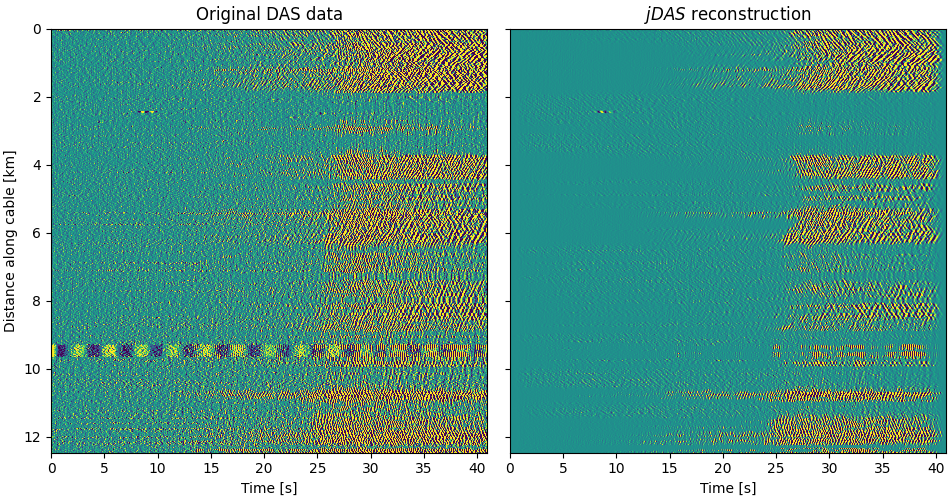

In [13]:
# Plotting parameters
imshow_kwargs = {
    "interpolation": "antialiased",
    "aspect": "auto",
    "vmin": -0.5,
    "vmax": 0.5,
    "extent": [t.min(), t.max(), dist.max(), dist.min()],
}

# Close all other figures
plt.close("all")
# Draw the canvas (2 columns)
fig, axes = plt.subplots(ncols=2, figsize=(9.5, 5), constrained_layout=True, sharey="all")

# Loop over columns and data sets (original and denoised data)
for ax, d, title in zip(axes, (data, clean_data), ("Original DAS data", "$jDAS$ reconstruction")):
    ax.imshow(d, **imshow_kwargs)
    ax.set_xlabel("Time [s]")
    ax.set_title(title)
    
axes[0].set_ylabel("Distance along cable [km]")

plt.show()